In [1]:
from pathlib import Path
import sys

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

sys.path.append("../")

from src.analytics.static_analysis import get_cluster_colors
from src.plots.boxplots import create_nse_boxplots
from src.plots.hex_maps import (
    hex_model_distribution_plots_n,
    hexes_plots_n,
)
from src.readers.geom_reader import load_geodata
from src.readers.hydro_series import load_metrics_from_directory
from src.timeseries_stats.metrics import evaluate_model
from src.utils.logger import setup_logger

plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

log = setup_logger("chapter_two", log_file="../logs/chapter_two.log")
# Base paths for optimization results
BASE_PATHS = {
    "gr4j": Path("../data/optimization/gr4j_simple"),
    "hbv": Path("../data/optimization/hbv_simple"),
    "rfr": Path("../data/optimization/rfr_simple"),
}

SERIES_PATH = {
    "gr4j": Path("../data/predictions/gr4j"),
    "hbv": Path("../data/predictions/hbv"),
    "rfr": Path("../data/predictions/rfr"),
    "lstm": Path("../data/predictions/lstm"),
}

POOR_PERIOD_PATH = {
    "gr4j": Path("../data/predictions/gr4j_poor_gauges"),
    "hbv": Path("../data/predictions/hbv_poor_gauges"),
    "rfr": Path("../data/predictions/rfr_poor_gauges"),
    "lstm": Path("../data/predictions/lstm_poor_gauges"),
}


## Setup & Imports

In [2]:
area_weighted = False

## 1. Load Data

In [3]:
# Load watershed geometries and gauge locations
ws, gauges = load_geodata(folder_depth="../")
common_index = gauges.index.to_list()
basemap_data = gpd.read_file("../data/geometry/basemap_2023.gpkg")

fine_tune_gauges = gpd.read_file("../data/res/FineTuneGauges.gpkg")[
    [
        "gauge_id",
        "name_ru",
        "name_en",
        "geometry",
    ]
]
fine_tune_gauges.set_index("gauge_id", inplace=True)

ft_index = fine_tune_gauges.index.tolist()

rest_gauges = gauges.loc[~gauges.index.isin(ft_index)]
rest_index = rest_gauges.index.tolist()
print(f"Loaded {len(gauges)} gauges with hybrid classification")

Loaded 996 gauges with hybrid classification


## 2. Load Model Results

In [4]:
# Load data for all models
model_data = {}
for model_name, base_path in BASE_PATHS.items():
    print(f"Loading {model_name} results from {base_path}...")
    model_data[model_name] = load_metrics_from_directory(base_path)
    print(f"  Found {len(model_data[model_name])} gauges")


Loading gr4j results from ../data/optimization/gr4j_simple...
  Found 996 gauges
Loading hbv results from ../data/optimization/hbv_simple...
  Found 996 gauges
Loading rfr results from ../data/optimization/rfr_simple...
  Found 996 gauges


In [5]:
model_data = {}
model_data_poor = {}
for model_name, series_path in SERIES_PATH.items():
    model_data[model_name] = {}
    model_data_poor[model_name] = {}
    for gauge_id in gauges.index:
        model_data[model_name][gauge_id] = {}
        model_data_poor[model_name][gauge_id] = {}
        for meteo in ["e5", "e5l", "gpcp", "mswep"]:
            try:
                data_df = pd.read_csv(
                    f"{series_path}/{gauge_id}/{gauge_id}_{meteo}_predictions.csv",
                    index_col="date",
                    parse_dates=True,
                ).loc["2019-01-01":"2020-12-31"]
                metrics = evaluate_model(
                    observed=data_df["q_obs"],
                    simulated=data_df["q_sim"],
                )
            except FileNotFoundError:
                print(f"File not found for {gauge_id} {meteo}")
                metrics = metrics = {
                    "NSE": np.nan,
                    "KGE": np.nan,
                    "PBIAS": np.nan,
                    "RMSE": np.nan,
                    "MAE": np.nan,
                    "logNSE": np.nan,
                    "R2": np.nan,
                    "r": np.nan,
                    "PFE": np.nan,
                }
            model_data[model_name][gauge_id][meteo] = metrics
            if gauge_id in ft_index:
                try:
                    data_df = pd.read_csv(
                        f"{POOR_PERIOD_PATH[model_name]}/{gauge_id}/{gauge_id}_{meteo}_predictions.csv",
                        index_col="date",
                        parse_dates=True,
                    ).loc["2017-01-01":"2018-12-31"]
                    metrics = evaluate_model(
                        observed=data_df["q_obs"],
                        simulated=data_df["q_sim"],
                    )
                except FileNotFoundError:
                    print(f"File not found for {gauge_id} {meteo}")
                    metrics = {
                        "NSE": np.nan,
                        "KGE": np.nan,
                        "PBIAS": np.nan,
                        "RMSE": np.nan,
                        "MAE": np.nan,
                        "logNSE": np.nan,
                        "R2": np.nan,
                        "r": np.nan,
                        "PFE": np.nan,
                    }
                model_data_poor[model_name][gauge_id][meteo] = metrics
model_data_poor = {
    model_name: {
        gauge_id: data for gauge_id, data in model_dict.items() if gauge_id in ft_index
    }
    for model_name, model_dict in model_data_poor.items()
}

File not found for 72192 mswep
File not found for 78092 e5l
File not found for 8161 gpcp
File not found for 10148 mswep
File not found for 49090 e5l


In [6]:
# Create separate dataframes for each model-dataset combination
dataset_dfs = {}

for model_name, model_dict in model_data.items():
    # Get available datasets from first gauge
    _sample_gauge = next(iter(model_dict))
    _datasets = list(model_dict[_sample_gauge].keys())

    for _dataset_name in _datasets:
        # Create dataframe for this model-dataset combination
        _rows = []

        for _gauge_id, _gauge_data in model_dict.items():
            if _dataset_name in _gauge_data:
                _metrics = _gauge_data[_dataset_name]
                _row = {"gauge_id": _gauge_id}
                _row.update(_metrics)
                _rows.append(_row)

        # Create dataframe
        _df_name = f"{model_name.lower()}_{_dataset_name}"
        _df = pd.DataFrame(_rows).set_index("gauge_id")

        # Reindex to common_index to ensure all gauges are present (fill missing with NaN)
        _df = _df.reindex(common_index)
        dataset_dfs[_df_name] = _df

        _missing_count = _df.isna().all(axis=1).sum()
        print(
            f"Created {_df_name}: {len(_df)} gauges × {len(_df.columns)} metrics "
            f"({_missing_count} missing)"
        )

print(f"\nTotal dataframes created: {len(dataset_dfs)}")
print(f"Available dataframes: {list(dataset_dfs.keys())}")

dataset_poor_dfs = {}

for model_name, model_dict in model_data_poor.items():
    # Get available datasets from first gauge
    _sample_gauge = next(iter(model_dict))
    _datasets = list(model_dict[_sample_gauge].keys())

    for _dataset_name in _datasets:
        # Create dataframe for this model-dataset combination
        _rows = []

        for _gauge_id, _gauge_data in model_dict.items():
            if _dataset_name in _gauge_data:
                _metrics = _gauge_data[_dataset_name]
                _row = {"gauge_id": _gauge_id}
                _row.update(_metrics)
                _rows.append(_row)

        # Create dataframe
        _df_name = f"{model_name.lower()}_{_dataset_name}"
        _df = pd.DataFrame(_rows).set_index("gauge_id")

        # Reindex to common_index to ensure all gauges are present (fill missing with NaN)
        _df = _df.reindex(ft_index)
        dataset_poor_dfs[_df_name] = _df

        _missing_count = _df.isna().all(axis=1).sum()
        print(
            f"Created {_df_name}: {len(_df)} gauges × {len(_df.columns)} metrics "
            f"({_missing_count} missing)"
        )

print(f"\nTotal dataframes created: {len(dataset_poor_dfs)}")
print(f"Available dataframes: {list(dataset_poor_dfs.keys())}")

Created gr4j_e5: 996 gauges × 9 metrics (0 missing)
Created gr4j_e5l: 996 gauges × 9 metrics (2 missing)
Created gr4j_gpcp: 996 gauges × 9 metrics (1 missing)
Created gr4j_mswep: 996 gauges × 9 metrics (2 missing)
Created hbv_e5: 996 gauges × 9 metrics (0 missing)
Created hbv_e5l: 996 gauges × 9 metrics (0 missing)
Created hbv_gpcp: 996 gauges × 9 metrics (0 missing)
Created hbv_mswep: 996 gauges × 9 metrics (0 missing)
Created rfr_e5: 996 gauges × 9 metrics (0 missing)
Created rfr_e5l: 996 gauges × 9 metrics (0 missing)
Created rfr_gpcp: 996 gauges × 9 metrics (0 missing)
Created rfr_mswep: 996 gauges × 9 metrics (0 missing)
Created lstm_e5: 996 gauges × 9 metrics (0 missing)
Created lstm_e5l: 996 gauges × 9 metrics (0 missing)
Created lstm_gpcp: 996 gauges × 9 metrics (0 missing)
Created lstm_mswep: 996 gauges × 9 metrics (0 missing)

Total dataframes created: 16
Available dataframes: ['gr4j_e5', 'gr4j_e5l', 'gr4j_gpcp', 'gr4j_mswep', 'hbv_e5', 'hbv_e5l', 'hbv_gpcp', 'hbv_mswep', 'rf

In [7]:
# Create individual variables for easy access
gr4j_e5l = dataset_dfs["gr4j_e5l"]
gr4j_e5l_poor = dataset_poor_dfs["gr4j_e5l"]
gr4j_gpcp = dataset_dfs["gr4j_gpcp"]
gr4j_gpcp_poor = dataset_poor_dfs["gr4j_gpcp"]
gr4j_e5 = dataset_dfs["gr4j_e5"]
gr4j_e5_poor = dataset_poor_dfs["gr4j_e5"]
gr4j_mswep = dataset_dfs["gr4j_mswep"]
gr4j_mswep_poor = dataset_poor_dfs["gr4j_mswep"]

hbv_e5l = dataset_dfs["hbv_e5l"]
hbv_e5l_poor = dataset_poor_dfs["hbv_e5l"]
hbv_gpcp = dataset_dfs["hbv_gpcp"]
hbv_gpcp_poor = dataset_poor_dfs["hbv_gpcp"]
hbv_e5 = dataset_dfs["hbv_e5"]
hbv_e5_poor = dataset_poor_dfs["hbv_e5"]
hbv_mswep = dataset_dfs["hbv_mswep"]
hbv_mswep_poor = dataset_poor_dfs["hbv_mswep"]

rfr_e5l = dataset_dfs["rfr_e5l"]
rfr_e5l_poor = dataset_poor_dfs["rfr_e5l"]
rfr_gpcp = dataset_dfs["rfr_gpcp"]
rfr_gpcp_poor = dataset_poor_dfs["rfr_gpcp"]
rfr_e5 = dataset_dfs["rfr_e5"]
rfr_e5_poor = dataset_poor_dfs["rfr_e5"]
rfr_mswep = dataset_dfs["rfr_mswep"]
rfr_mswep_poor = dataset_poor_dfs["rfr_mswep"]

lstm_e5l = dataset_dfs["lstm_e5l"]
lstm_e5l_poor = dataset_poor_dfs["lstm_e5l"]
lstm_gpcp = dataset_dfs["lstm_gpcp"]
lstm_gpcp_poor = dataset_poor_dfs["lstm_gpcp"]
lstm_e5 = dataset_dfs["lstm_e5"]
lstm_e5_poor = dataset_poor_dfs["lstm_e5"]
lstm_mswep = dataset_dfs["lstm_mswep"]
lstm_mswep_poor = dataset_poor_dfs["lstm_mswep"]


print("✓ Created individual dataframe variables:")
print("  GR4J: gr4j_e5l, gr4j_gpcp, gr4j_e5, gr4j_mswep")
print("  HBV:  hbv_e5l, hbv_gpcp, hbv_e5, hbv_mswep")
print("  RFR:  rfr_e5l, rfr_gpcp, rfr_e5, rfr_mswep")
print("  LSTM: lstm_e5l, lstm_gpcp, lstm_e5, lstm_mswep")


✓ Created individual dataframe variables:
  GR4J: gr4j_e5l, gr4j_gpcp, gr4j_e5, gr4j_mswep
  HBV:  hbv_e5l, hbv_gpcp, hbv_e5, hbv_mswep
  RFR:  rfr_e5l, rfr_gpcp, rfr_e5, rfr_mswep
  LSTM: lstm_e5l, lstm_gpcp, lstm_e5, lstm_mswep


In [8]:
# Optional: Load additional LSTM variants if needed
lstm_single = pd.read_csv(
    "../data/optimization/lstm/Single_LSTM_table.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
lstm_single = lstm_single.loc[common_index, :]
lstm_no_static = pd.read_csv(
    "../data/optimization/lstm/LSTM_no_static_res.csv",
    index_col="gauge_id",
    dtype={"gauge_id": str},
)
lstm_no_static = lstm_no_static.loc[common_index, :]


### HBV

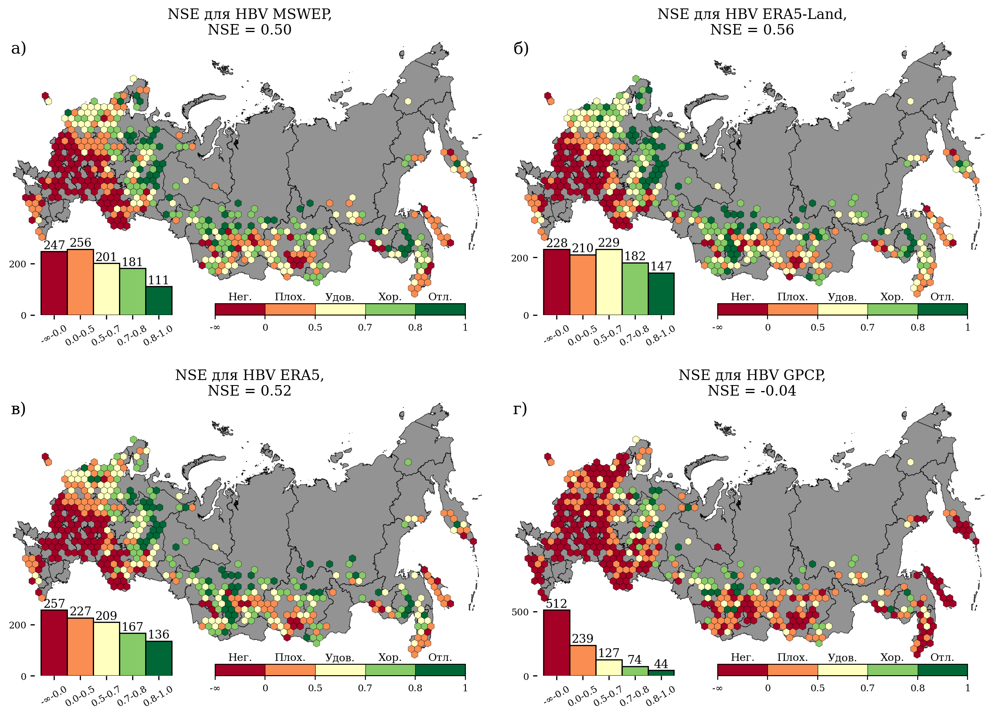

In [15]:
gauges_nse = gauges.copy()
ws_nse = ws.copy()

gauges_nse["hbv_nse_e5l"] = hbv_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["hbv_nse_e5l"] = hbv_e5l.loc[ws.index, "NSE"]
hbv_nse_e5l = gauges_nse["hbv_nse_e5l"].median()

gauges_nse["hbv_nse_e5"] = hbv_e5.loc[gauges_nse.index, "NSE"]
ws_nse["hbv_nse_e5"] = hbv_e5.loc[ws.index, "NSE"]
hbv_nse_e5 = gauges_nse["hbv_nse_e5"].median()

gauges_nse["hbv_nse_gpcp"] = hbv_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["hbv_nse_gpcp"] = hbv_gpcp.loc[ws.index, "NSE"]
hbv_nse_gpcp = gauges_nse["hbv_nse_gpcp"].median()

gauges_nse["hbv_nse_mswep"] = hbv_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["hbv_nse_mswep"] = hbv_mswep.loc[ws.index, "NSE"]
hbv_nse_mswep = gauges_nse["hbv_nse_mswep"].median()


fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=area_weighted,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для HBV MSWEP,\nNSE = {hbv_nse_mswep:.2f}",
        f"NSE для HBV ERA5-Land,\nNSE = {hbv_nse_e5l:.2f}",
        f"NSE для HBV ERA5,\nNSE = {hbv_nse_e5:.2f}",
        f"NSE для HBV GPCP,\nNSE = {hbv_nse_gpcp:.2f}",
    ],
)


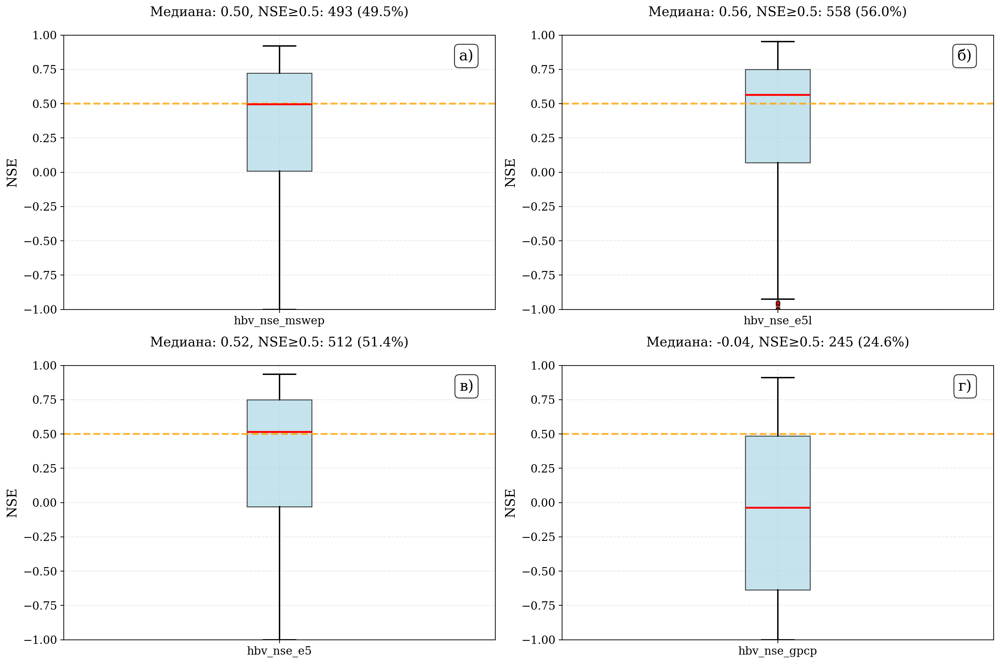

In [94]:
hbv_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"],
    figsize=(15, 10),
    max_cols=2,
)


### Merge poor gauges into "good" ones


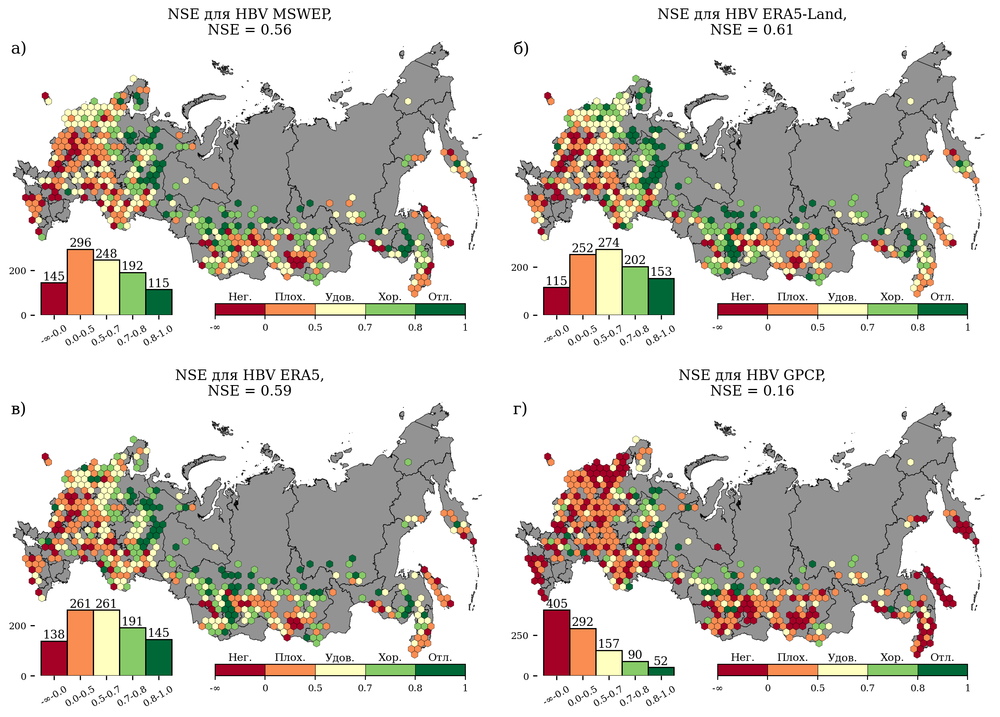

In [ ]:
_hbv_e5l = hbv_e5l.copy()
_hbv_e5 = hbv_e5.copy()
_hbv_gpcp = hbv_gpcp.copy()
_hbv_mswep = hbv_mswep.copy()

_hbv_e5l.loc[ft_index, :] = hbv_e5l_poor.loc[ft_index, :]
_hbv_e5.loc[ft_index, :] = hbv_e5_poor.loc[ft_index, :]
_hbv_gpcp.loc[ft_index, :] = hbv_gpcp_poor.loc[ft_index, :]
_hbv_mswep.loc[ft_index, :] = hbv_mswep_poor.loc[ft_index, :]


gauges_nse["hbv_nse_e5l"] = _hbv_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["hbv_nse_e5l"] = _hbv_e5l.loc[ws.index, "NSE"]
hbv_nse_e5l = gauges_nse["hbv_nse_e5l"].median()

gauges_nse["hbv_nse_e5"] = _hbv_e5.loc[gauges_nse.index, "NSE"]
ws_nse["hbv_nse_e5"] = _hbv_e5.loc[ws.index, "NSE"]
hbv_nse_e5 = gauges_nse["hbv_nse_e5"].median()

gauges_nse["hbv_nse_gpcp"] = _hbv_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["hbv_nse_gpcp"] = _hbv_gpcp.loc[ws.index, "NSE"]
hbv_nse_gpcp = gauges_nse["hbv_nse_gpcp"].median()

gauges_nse["hbv_nse_mswep"] = _hbv_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["hbv_nse_mswep"] = _hbv_mswep.loc[ws.index, "NSE"]
hbv_nse_mswep = gauges_nse["hbv_nse_mswep"].median()


fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=area_weighted,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для HBV MSWEP,\nNSE = {hbv_nse_mswep:.2f}",
        f"NSE для HBV ERA5-Land,\nNSE = {hbv_nse_e5l:.2f}",
        f"NSE для HBV ERA5,\nNSE = {hbv_nse_e5:.2f}",
        f"NSE для HBV GPCP,\nNSE = {hbv_nse_gpcp:.2f}",
    ],
)


### GR4J

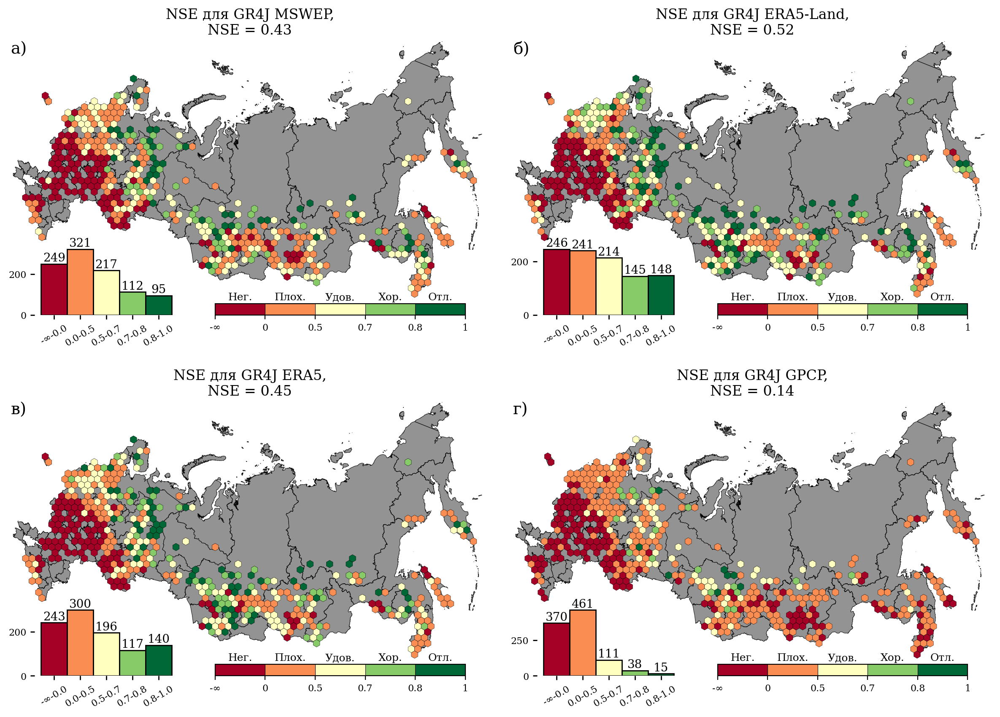

In [30]:
gauges_nse["gr4j_nse_e5l"] = gr4j_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_e5l"] = gr4j_e5l.loc[ws.index, "NSE"]
gr4j_nse_e5l = gauges_nse["gr4j_nse_e5l"].median()

gauges_nse["gr4j_nse_e5"] = gr4j_e5.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_e5"] = gr4j_e5.loc[ws.index, "NSE"]
gr4j_nse_e5 = gauges_nse["gr4j_nse_e5"].median()

gauges_nse["gr4j_nse_gpcp"] = gr4j_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_gpcp"] = gr4j_gpcp.loc[ws.index, "NSE"]
gr4j_nse_gpcp = gauges_nse["gr4j_nse_gpcp"].median()

gauges_nse["gr4j_nse_mswep"] = gr4j_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_mswep"] = gr4j_mswep.loc[ws.index, "NSE"]
gr4j_nse_mswep = gauges_nse["gr4j_nse_mswep"].median()

fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=area_weighted,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для GR4J MSWEP,\nNSE = {gr4j_nse_mswep:.2f}",
        f"NSE для GR4J ERA5-Land,\nNSE = {gr4j_nse_e5l:.2f}",
        f"NSE для GR4J ERA5,\nNSE = {gr4j_nse_e5:.2f}",
        f"NSE для GR4J GPCP,\nNSE = {gr4j_nse_gpcp:.2f}",
    ],
)


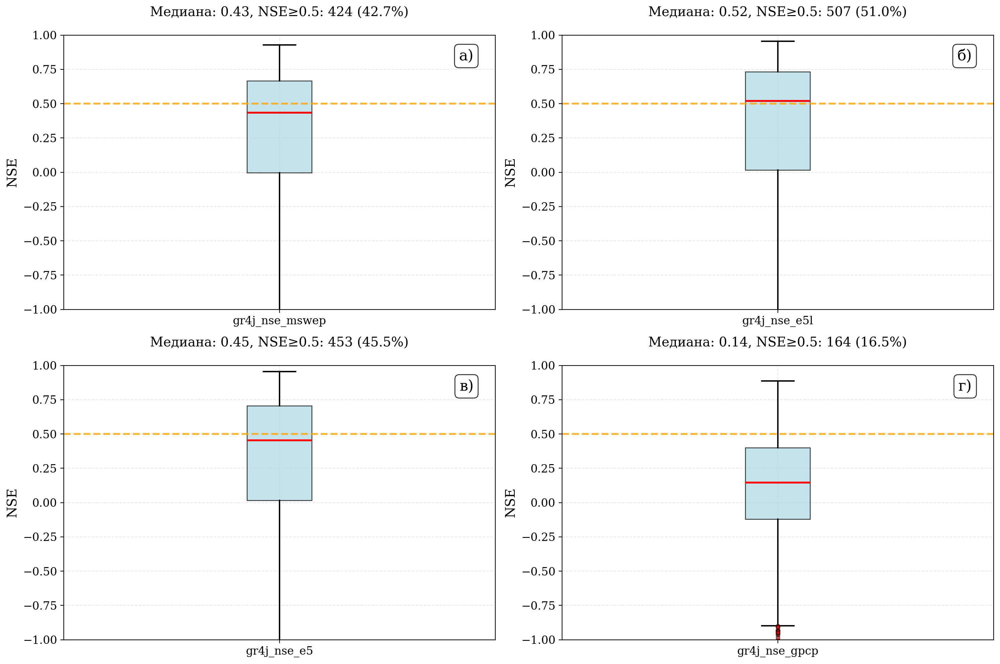

In [122]:
gr4j_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"],
    figsize=(15, 10),
    max_cols=2,
)


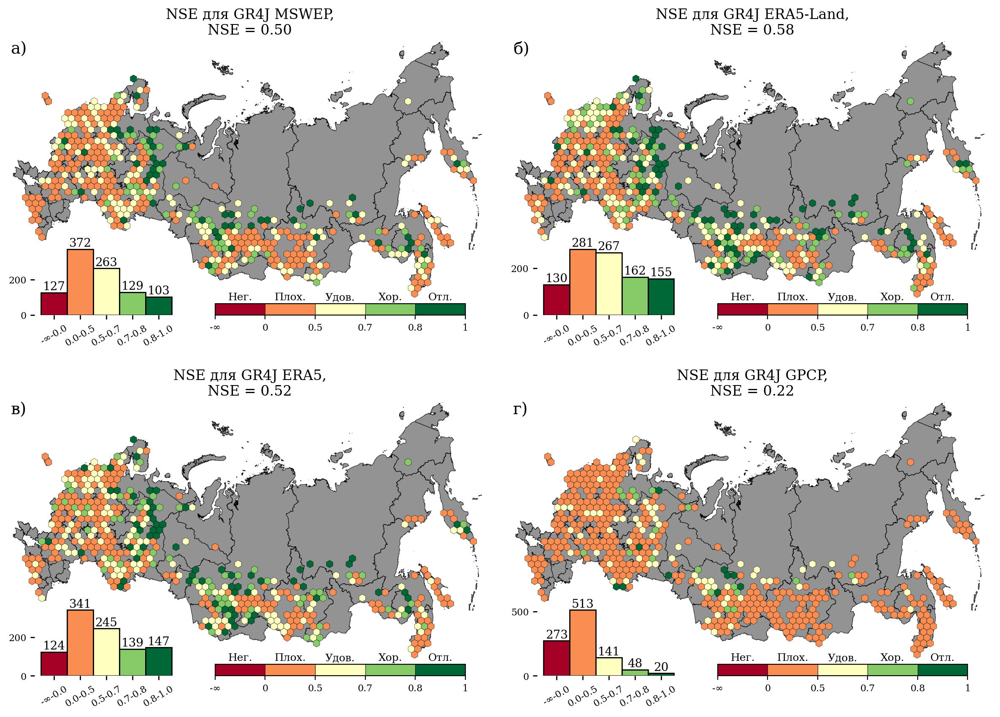

In [ ]:
_gr4j_e5l = gr4j_e5l.copy()
_gr4j_e5 = gr4j_e5.copy()
_gr4j_gpcp = gr4j_gpcp.copy()
_gr4j_mswep = gr4j_mswep.copy()

_gr4j_e5l.loc[ft_index, :] = gr4j_e5l_poor.loc[ft_index, :]
_gr4j_e5.loc[ft_index, :] = gr4j_e5_poor.loc[ft_index, :]
_gr4j_gpcp.loc[ft_index, :] = gr4j_gpcp_poor.loc[ft_index, :]
_gr4j_mswep.loc[ft_index, :] = gr4j_mswep_poor.loc[ft_index, :]


gauges_nse["gr4j_nse_e5l"] = _gr4j_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_e5l"] = _gr4j_e5l.loc[ws.index, "NSE"]
gr4j_nse_e5l = gauges_nse["gr4j_nse_e5l"].median()

gauges_nse["gr4j_nse_e5"] = _gr4j_e5.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_e5"] = _gr4j_e5.loc[ws.index, "NSE"]
gr4j_nse_e5 = gauges_nse["gr4j_nse_e5"].median()

gauges_nse["gr4j_nse_gpcp"] = _gr4j_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_gpcp"] = _gr4j_gpcp.loc[ws.index, "NSE"]
gr4j_nse_gpcp = gauges_nse["gr4j_nse_gpcp"].median()

gauges_nse["gr4j_nse_mswep"] = _gr4j_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["gr4j_nse_mswep"] = _gr4j_mswep.loc[ws.index, "NSE"]
gr4j_nse_mswep = gauges_nse["gr4j_nse_mswep"].median()

fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=area_weighted,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для GR4J MSWEP,\nNSE = {gr4j_nse_mswep:.2f}",
        f"NSE для GR4J ERA5-Land,\nNSE = {gr4j_nse_e5l:.2f}",
        f"NSE для GR4J ERA5,\nNSE = {gr4j_nse_e5:.2f}",
        f"NSE для GR4J GPCP,\nNSE = {gr4j_nse_gpcp:.2f}",
    ],
)


### RFR

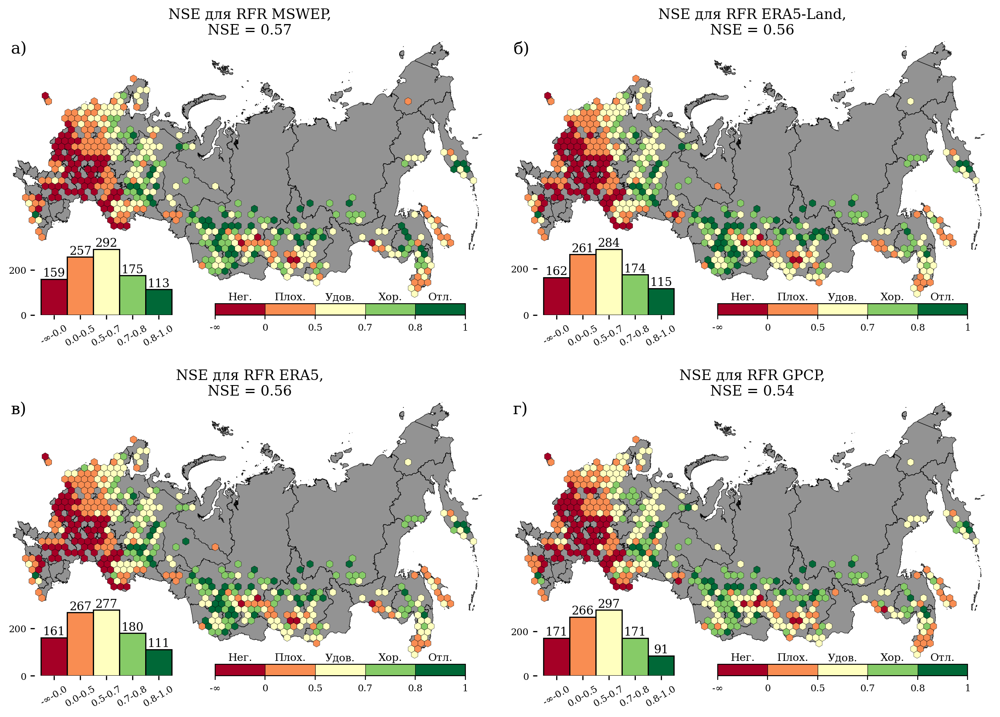

In [31]:
gauges_nse["rfr_nse_e5l"] = rfr_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_e5l"] = rfr_e5l.loc[ws.index, "NSE"]
rfr_nse_e5l = gauges_nse["rfr_nse_e5l"].median()

gauges_nse["rfr_nse_e5"] = rfr_e5.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_e5"] = rfr_e5.loc[ws.index, "NSE"]
rfr_nse_e5 = gauges_nse["rfr_nse_e5"].median()

gauges_nse["rfr_nse_gpcp"] = rfr_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_gpcp"] = rfr_gpcp.loc[ws.index, "NSE"]
rfr_nse_gpcp = gauges_nse["rfr_nse_gpcp"].median()

gauges_nse["rfr_nse_mswep"] = rfr_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_mswep"] = rfr_mswep.loc[ws.index, "NSE"]
rfr_nse_mswep = gauges_nse["rfr_nse_mswep"].median()

fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=area_weighted,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для RFR MSWEP,\nNSE = {rfr_nse_mswep:.2f}",
        f"NSE для RFR ERA5-Land,\nNSE = {rfr_nse_e5l:.2f}",
        f"NSE для RFR ERA5,\nNSE = {rfr_nse_e5:.2f}",
        f"NSE для RFR GPCP,\nNSE = {rfr_nse_gpcp:.2f}",
    ],
)


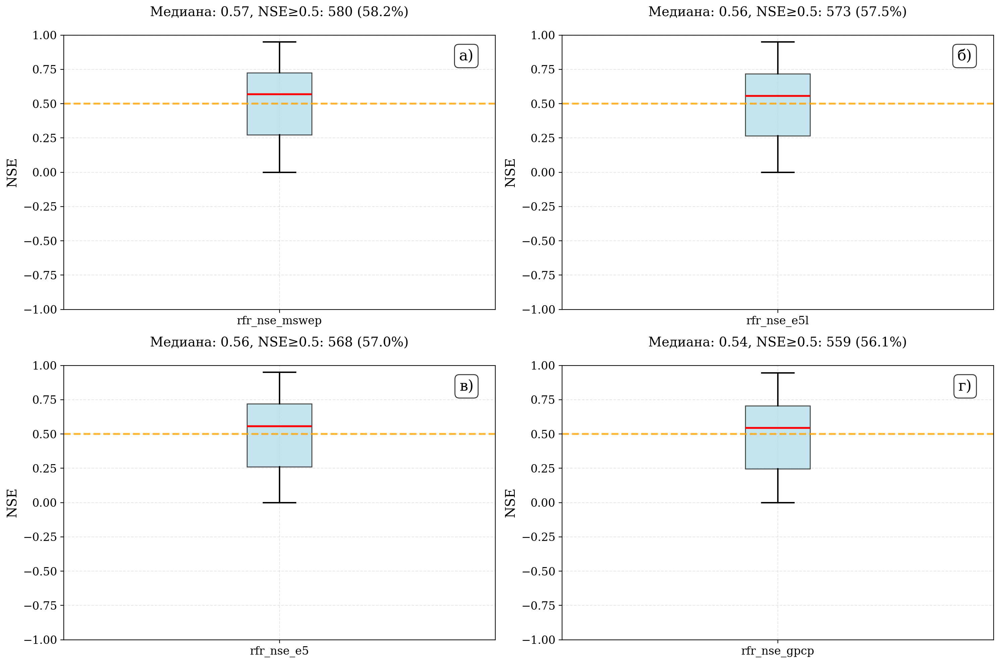

In [123]:
rfr_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"],
    figsize=(15, 10),
    max_cols=2,
)


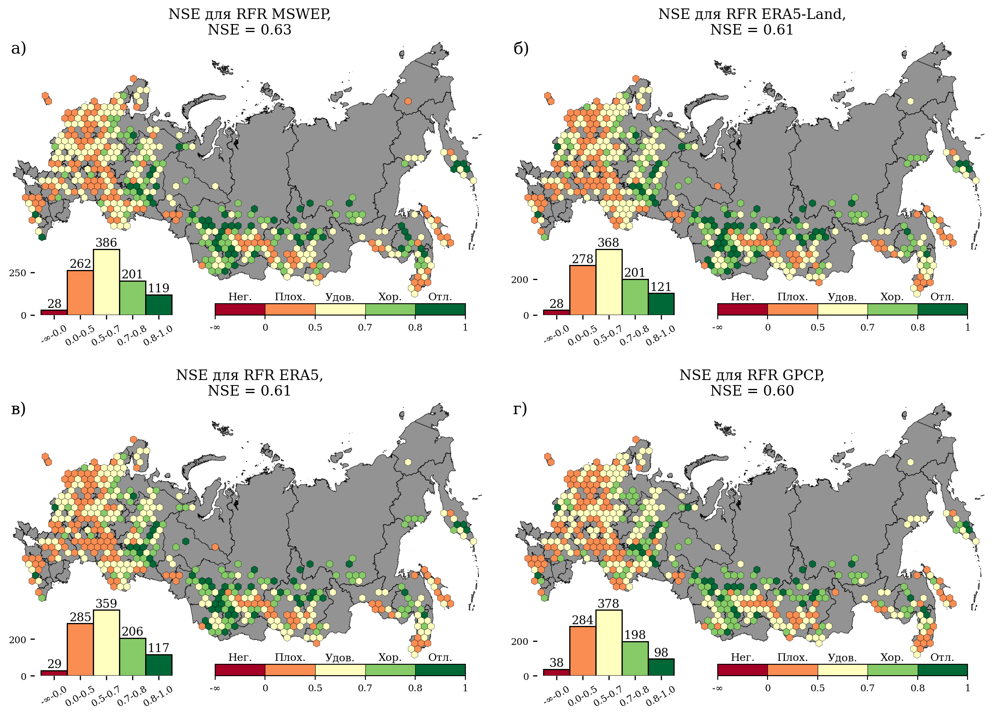

In [ ]:
_rfr_e5l = rfr_e5l.copy()
_rfr_e5 = rfr_e5.copy()
_rfr_gpcp = rfr_gpcp.copy()
_rfr_mswep = rfr_mswep.copy()

_rfr_e5l.loc[ft_index, :] = rfr_e5l_poor.loc[ft_index, :]
_rfr_e5.loc[ft_index, :] = rfr_e5_poor.loc[ft_index, :]
_rfr_gpcp.loc[ft_index, :] = rfr_gpcp_poor.loc[ft_index, :]
_rfr_mswep.loc[ft_index, :] = rfr_mswep_poor.loc[ft_index, :]

gauges_nse["rfr_nse_e5l"] = _rfr_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_e5l"] = _rfr_e5l.loc[ws.index, "NSE"]
rfr_nse_e5l = gauges_nse["rfr_nse_e5l"].median()

gauges_nse["rfr_nse_e5"] = _rfr_e5.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_e5"] = _rfr_e5.loc[ws.index, "NSE"]
rfr_nse_e5 = gauges_nse["rfr_nse_e5"].median()

gauges_nse["rfr_nse_gpcp"] = _rfr_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_gpcp"] = _rfr_gpcp.loc[ws.index, "NSE"]
rfr_nse_gpcp = gauges_nse["rfr_nse_gpcp"].median()

gauges_nse["rfr_nse_mswep"] = _rfr_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["rfr_nse_mswep"] = _rfr_mswep.loc[ws.index, "NSE"]
rfr_nse_mswep = gauges_nse["rfr_nse_mswep"].median()

fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=False,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    negative_priority=True,
    with_histogram=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для RFR MSWEP,\nNSE = {rfr_nse_mswep:.2f}",
        f"NSE для RFR ERA5-Land,\nNSE = {rfr_nse_e5l:.2f}",
        f"NSE для RFR ERA5,\nNSE = {rfr_nse_e5:.2f}",
        f"NSE для RFR GPCP,\nNSE = {rfr_nse_gpcp:.2f}",
    ],
)


### LSTM

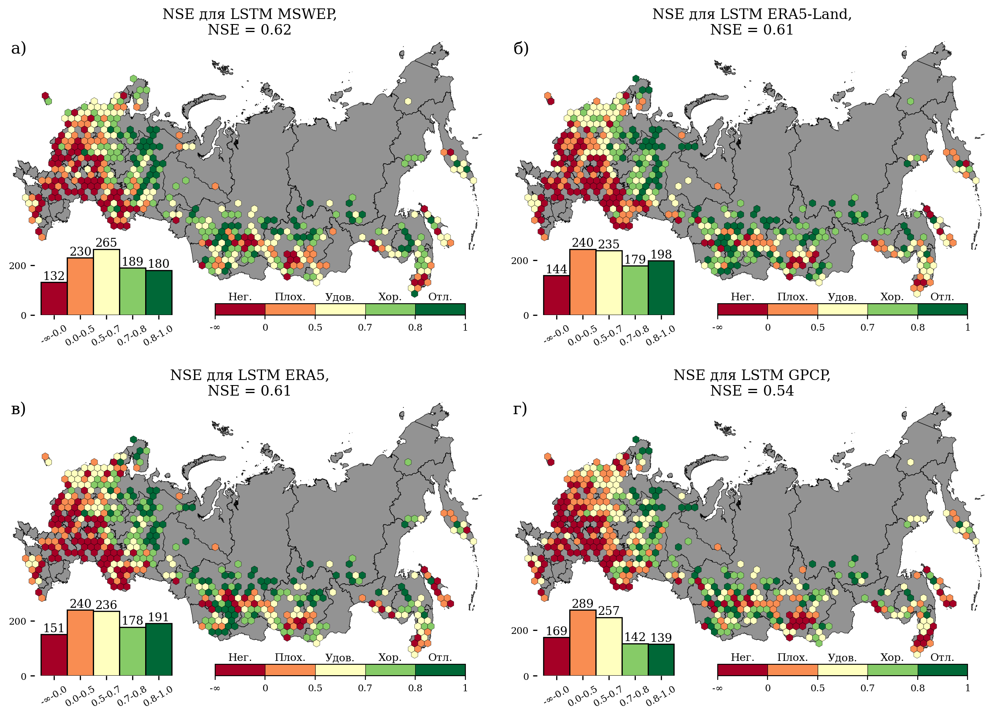

In [40]:
gauges_nse["lstm_nse_e5l"] = lstm_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_e5l"] = lstm_e5l.loc[ws.index, "NSE"]
lstm_nse_e5l = gauges_nse["lstm_nse_e5l"].median()

gauges_nse["lstm_nse_e5"] = lstm_e5.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_e5"] = lstm_e5.loc[ws.index, "NSE"]
lstm_nse_e5 = gauges_nse["lstm_nse_e5"].median()

gauges_nse["lstm_nse_gpcp"] = lstm_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_gpcp"] = lstm_gpcp.loc[ws.index, "NSE"]
lstm_nse_gpcp = gauges_nse["lstm_nse_gpcp"].median()

gauges_nse["lstm_nse_mswep"] = lstm_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_mswep"] = lstm_mswep.loc[ws.index, "NSE"]
lstm_nse_mswep = gauges_nse["lstm_nse_mswep"].median()


fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=area_weighted,
    min_overlap_share=0.15,
    quantile=0.5,
    negative_priority=True,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для LSTM MSWEP,\nNSE = {lstm_nse_mswep:.2f}",
        f"NSE для LSTM ERA5-Land,\nNSE = {lstm_nse_e5l:.2f}",
        f"NSE для LSTM ERA5,\nNSE = {lstm_nse_e5:.2f}",
        f"NSE для LSTM GPCP,\nNSE = {lstm_nse_gpcp:.2f}",
    ],
)


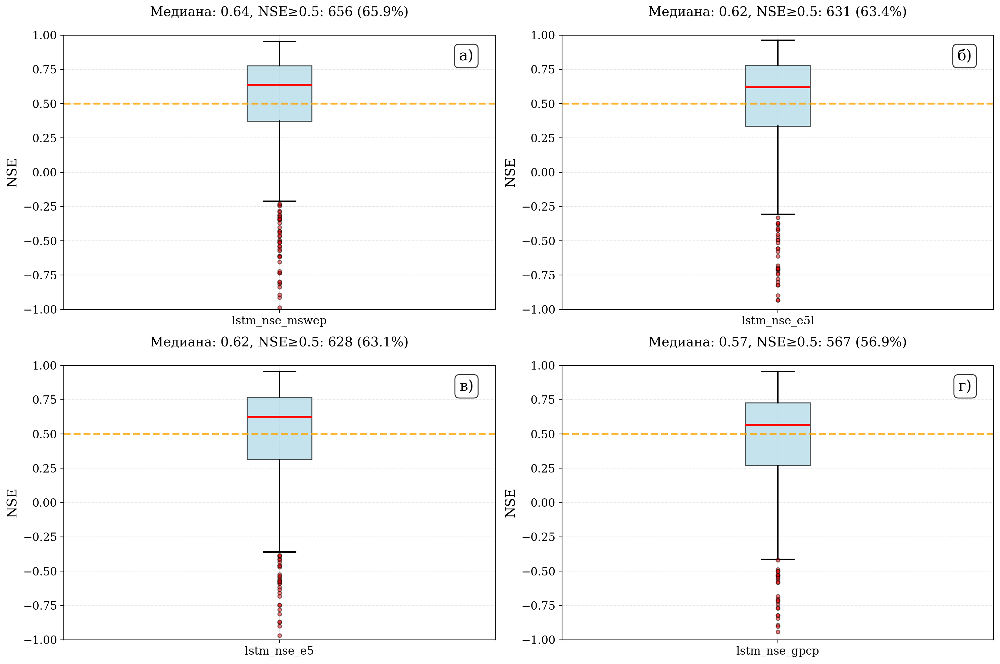

In [126]:
lstm_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"],
    figsize=(15, 10),
    max_cols=2,
)


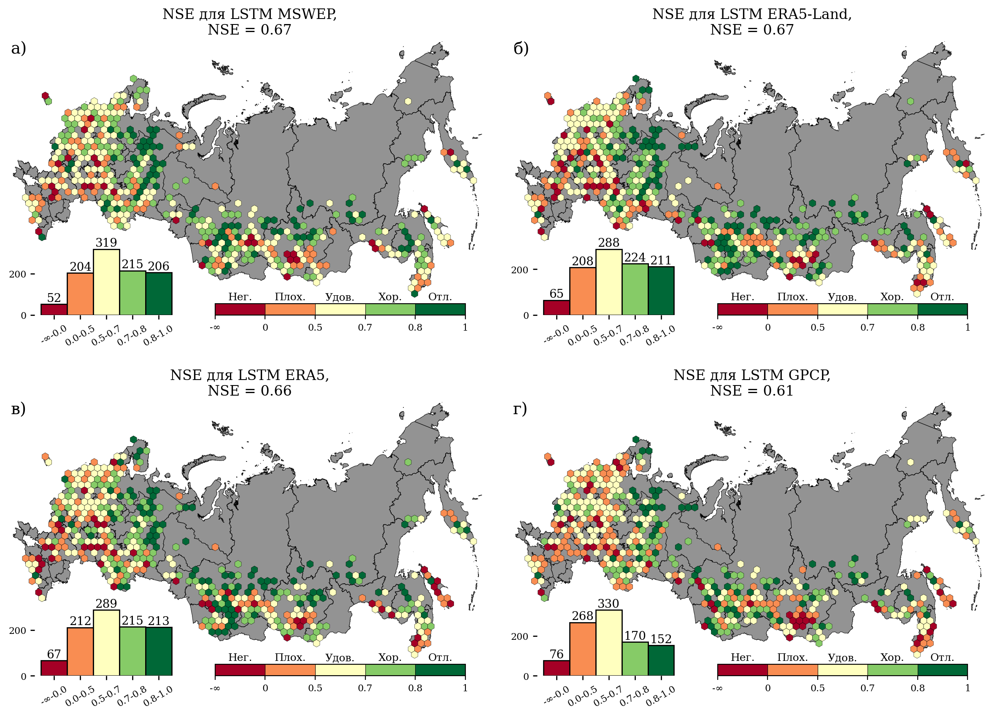

In [41]:
_lstm_e5l = lstm_e5l.copy()
_lstm_e5 = lstm_e5.copy()
_lstm_gpcp = lstm_gpcp.copy()
_lstm_mswep = lstm_mswep.copy()

_lstm_e5l.loc[ft_index, :] = lstm_e5l_poor.loc[ft_index, :]
_lstm_e5.loc[ft_index, :] = lstm_e5_poor.loc[ft_index, :]
_lstm_gpcp.loc[ft_index, :] = lstm_gpcp_poor.loc[ft_index, :]
_lstm_mswep.loc[ft_index, :] = lstm_mswep_poor.loc[ft_index, :]

gauges_nse["lstm_nse_e5l"] = _lstm_e5l.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_e5l"] = _lstm_e5l.loc[ws.index, "NSE"]
lstm_nse_e5l = gauges_nse["lstm_nse_e5l"].median()

gauges_nse["lstm_nse_e5"] = _lstm_e5.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_e5"] = _lstm_e5.loc[ws.index, "NSE"]
lstm_nse_e5 = gauges_nse["lstm_nse_e5"].median()

gauges_nse["lstm_nse_gpcp"] = _lstm_gpcp.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_gpcp"] = _lstm_gpcp.loc[ws.index, "NSE"]
lstm_nse_gpcp = gauges_nse["lstm_nse_gpcp"].median()

gauges_nse["lstm_nse_mswep"] = _lstm_mswep.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_mswep"] = _lstm_mswep.loc[ws.index, "NSE"]
lstm_nse_mswep = gauges_nse["lstm_nse_mswep"].median()


fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"]
    ],
    basemap_data=basemap_data,
    metric_cols=["lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=area_weighted,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    negative_threshold=0.3,
    with_histogram=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для LSTM MSWEP,\nNSE = {lstm_nse_mswep:.2f}",
        f"NSE для LSTM ERA5-Land,\nNSE = {lstm_nse_e5l:.2f}",
        f"NSE для LSTM ERA5,\nNSE = {lstm_nse_e5:.2f}",
        f"NSE для LSTM GPCP,\nNSE = {lstm_nse_gpcp:.2f}",
    ],
)


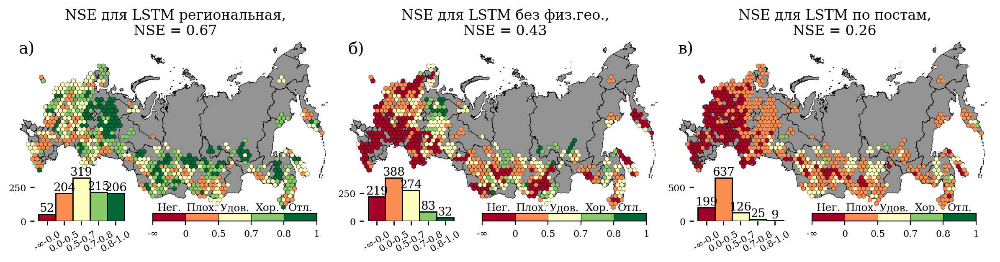

In [38]:
gauges_nse["lstm_nse_no_static"] = lstm_no_static.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_no_static"] = lstm_no_static.loc[ws.index, "NSE"]
lstm_nse_no_static = gauges_nse["lstm_nse_no_static"].median()

gauges_nse["lstm_nse_single"] = lstm_single.loc[gauges_nse.index, "NSE"]
ws_nse["lstm_nse_single"] = lstm_single.loc[ws.index, "NSE"]
lstm_nse_single = gauges_nse["lstm_nse_single"].median()


fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "lstm_nse_mswep", "lstm_nse_no_static", "lstm_nse_single"]
    ],
    basemap_data=basemap_data,
    metric_cols=[
        "lstm_nse_mswep",
        "lstm_nse_no_static",
        "lstm_nse_single",
    ],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=1,
    ncols=3,
    target_ws_per_hex=6.0,
    area_weighted=True,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    with_histogram=True,
    negative_priority=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для LSTM региональная,\nNSE = {lstm_nse_mswep:.2f}",
        f"NSE для LSTM без физ.гео.,\nNSE = {lstm_nse_no_static:.2f}",
        f"NSE для LSTM по постам,\nNSE = {lstm_nse_single:.2f}",
    ],
)


### Ensemble Models

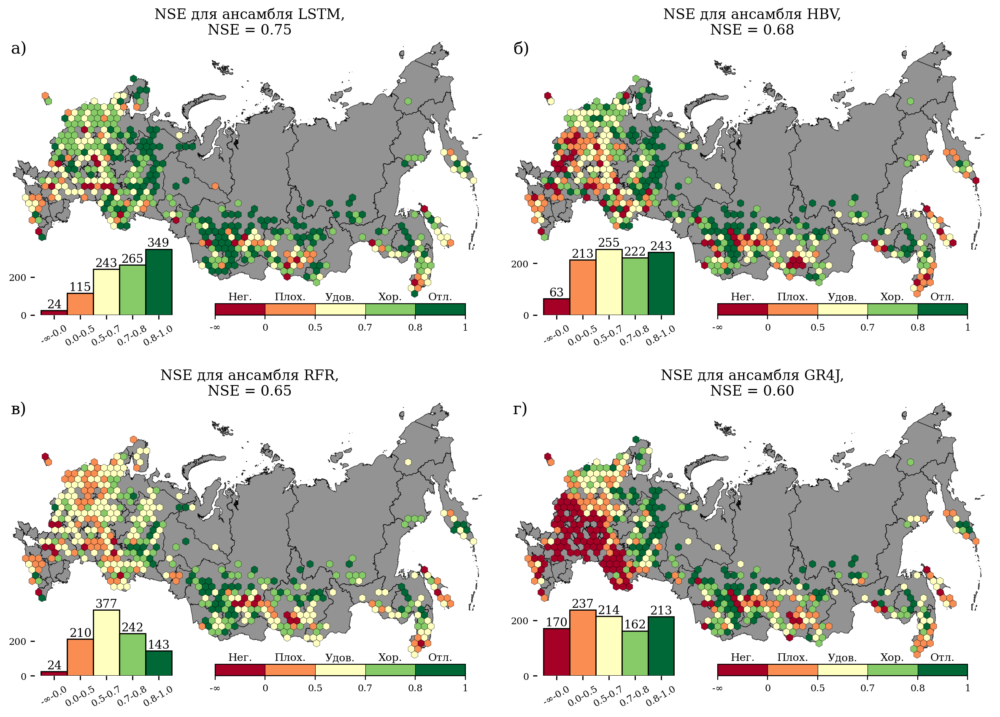

In [37]:
gauges_nse["Best GR4J NSE"] = gauges_nse[
    ["gr4j_nse_mswep", "gr4j_nse_e5l", "gr4j_nse_e5", "gr4j_nse_gpcp"]
].max(axis=1)
ws_nse["Best GR4J NSE"] = gauges_nse["Best GR4J NSE"].loc[ws.index]
best_gr4j_nse = gauges_nse["Best GR4J NSE"].median()

gauges_nse["Best HBV NSE"] = gauges_nse[
    ["hbv_nse_mswep", "hbv_nse_e5l", "hbv_nse_e5", "hbv_nse_gpcp"]
].max(axis=1)
ws_nse["Best HBV NSE"] = gauges_nse["Best HBV NSE"].loc[ws.index]
best_hbv_nse = gauges_nse["Best HBV NSE"].median()

gauges_nse["Best RFR NSE"] = gauges_nse[
    ["rfr_nse_mswep", "rfr_nse_e5l", "rfr_nse_e5", "rfr_nse_gpcp"]
].max(axis=1)
ws_nse["Best RFR NSE"] = gauges_nse["Best RFR NSE"].loc[ws.index]
best_rfr_nse = gauges_nse["Best RFR NSE"].median()

gauges_nse["Best LSTM NSE"] = gauges_nse[
    ["lstm_nse_mswep", "lstm_nse_e5l", "lstm_nse_e5", "lstm_nse_gpcp"]
].max(axis=1)
ws_nse["Best LSTM NSE"] = gauges_nse["Best LSTM NSE"].loc[ws.index]
best_lstm_nse = gauges_nse["Best LSTM NSE"].median()

gauges_nse["Best Models"] = gauges_nse[
    ["Best GR4J NSE", "Best HBV NSE", "Best RFR NSE", "Best LSTM NSE"]
].max(axis=1)
ws_nse["Best Models"] = gauges_nse["Best Models"].loc[ws.index]
best_models_nse = gauges_nse["Best Models"].median()

fig, hex_maps, radius_km, coverage_stats = hexes_plots_n(
    watersheds=ws_nse[
        ["geometry", "Best LSTM NSE", "Best HBV NSE", "Best RFR NSE", "Best GR4J NSE"]
    ],
    basemap_data=basemap_data,
    metric_cols=["Best LSTM NSE", "Best HBV NSE", "Best RFR NSE", "Best GR4J NSE"],
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    target_ws_per_hex=6.0,
    area_weighted=area_weighted,
    min_overlap_share=0.15,
    quantile=0.5,
    list_of_limits=[-np.inf, 0.0, 0.5, 0.7, 0.8, 1.0],  # Added -np.inf
    figsize=(15, 10),
    basemap_alpha=0.85,
    negative_priority=True,
    with_histogram=True,
    cb_label=["Нег.", "Плох.", "Удов.", "Хор.", "Отл."],  # Added "Нег."
    title_text=[
        f"NSE для ансамбля LSTM,\nNSE = {best_lstm_nse:.2f}",
        f"NSE для ансамбля HBV,\nNSE = {best_hbv_nse:.2f}",
        f"NSE для ансамбля RFR,\nNSE = {best_rfr_nse:.2f}",
        f"NSE для ансамбля GR4J,\nNSE = {best_gr4j_nse:.2f}",
    ],
)


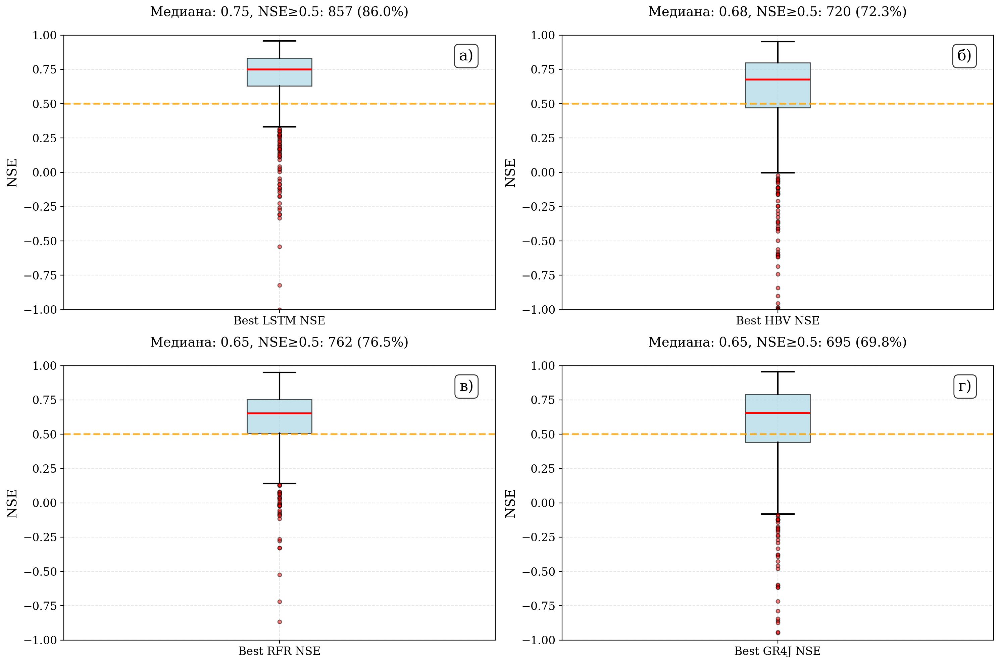

In [122]:
ensemble_boxplots = create_nse_boxplots(
    df=gauges_nse,
    nse_columns=["Best LSTM NSE", "Best HBV NSE", "Best RFR NSE", "Best GR4J NSE"],
    figsize=(15, 10),
    max_cols=2,
)

### Meteo input for each type of model

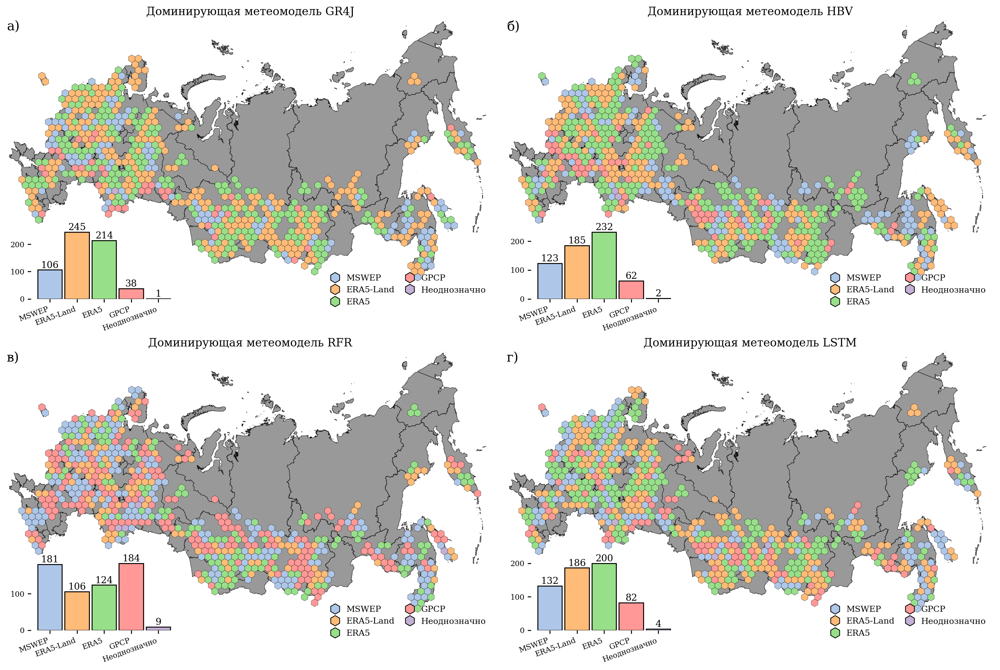

In [125]:

# Prepare data for all 4 models
for _model_name in ["GR4J", "HBV", "RFR", "LSTM"]:
    _col_name = f"Лучшая метео модель {_model_name}"

    # Find best meteo model indices
    _mswep_idx = gauges_nse[
        gauges_nse[f"Best {_model_name} NSE"].isin(
            gauges_nse[f"{_model_name.lower()}_nse_mswep"]
        )
    ].index
    _era5_idx = gauges_nse[
        gauges_nse[f"Best {_model_name} NSE"].isin(
            gauges_nse[f"{_model_name.lower()}_nse_e5"]
        )
    ].index
    _era5l_idx = gauges_nse[
        gauges_nse[f"Best {_model_name} NSE"].isin(
            gauges_nse[f"{_model_name.lower()}_nse_e5l"]
        )
    ].index
    _gpcp_idx = gauges_nse[
        gauges_nse[f"Best {_model_name} NSE"].isin(
            gauges_nse[f"{_model_name.lower()}_nse_gpcp"]
        )
    ].index

    # Assign labels
    for _name, _idx in {
        "MSWEP": _mswep_idx,
        "ERA5": _era5_idx,
        "ERA5-Land": _era5l_idx,
        "GPCP": _gpcp_idx,
    }.items():
        gauges_nse.loc[_idx, _col_name] = _name

    # Copy to watersheds
    ws_nse.loc[common_index, [_col_name]] = gauges_nse.loc[:, [_col_name]]

# Define model dictionary and colors
model_dict = {
    "MSWEP": 1.0,
    "ERA5-Land": 2.0,
    "ERA5": 3.0,
    "GPCP": 4.0,
    "Неоднозначно": 5.0,
    np.nan: np.nan,
}

# Use secondary (softer) colors from cluster palette
_all_colors = get_cluster_colors(n_clusters=20)
_model_colors = _all_colors[15:20]  # Secondary palette (indices 15-19)

# Create multi-panel plot with histograms and per-subplot legends
fig, axes, hex_results, counts = hex_model_distribution_plots_n(
    watersheds=ws_nse,
    basemap_data=basemap_data,
    model_cols=[
        "Лучшая метео модель GR4J",
        "Лучшая метео модель HBV",
        "Лучшая метео модель RFR",
        "Лучшая метео модель LSTM",
    ],
    model_dict=model_dict,
    label_list=["а)", "б)", "в)", "г)"],
    nrows=2,
    ncols=2,
    min_overlap_share=0.15,
    dominant_threshold=0.33,
    target_ws_per_hex=6.0,
    color_list=_model_colors,
    figsize=(15, 10),
    with_histogram=True,
    histogram_rect=[0.05, 0.05, 0.30, 0.24],
    histogram_label_rotation=20,
    legend_show=True,
    legend_kwargs={"loc": "lower right", "bbox_to_anchor": (1.0, 0.0)},
    title_text=[
        "Доминирующая метеомодель GR4J",
        "Доминирующая метеомодель HBV",
        "Доминирующая метеомодель RFR",
        "Доминирующая метеомодель LSTM",
    ],
)

plt.show()

### Best Model Analysis

Определение лучшей модели для каждого водосбора и соответствующего метеоисточника

In [126]:
# Define best model columns for comparison
best_model_cols = {
    "GR4J": "Best GR4J NSE",
    "HBV": "Best HBV NSE",
    "RFR": "Best RFR NSE",
    "LSTM": "Best LSTM NSE",
}

# Find the best model for each gauge
gauges_nse["Лучшая модель"] = gauges_nse[list(best_model_cols.values())].idxmax(axis=1)

# Map to cleaner model names
_model_name_map = {
    "Best GR4J NSE": "GR4J",
    "Best HBV NSE": "HBV",
    "Best RFR NSE": "RFR",
    "Best LSTM NSE": "LSTM",
}
gauges_nse["Лучшая модель"] = gauges_nse["Лучшая модель"].map(_model_name_map)

# Copy to watersheds
ws_nse.loc[common_index, "Лучшая модель"] = gauges_nse.loc[:, "Лучшая модель"]

# Count best models distribution
best_model_counts = gauges_nse["Лучшая модель"].value_counts()

In [127]:
# For each gauge, find the best meteo source corresponding to the best model
# This requires checking which meteo source gave the best NSE for the winning model


def get_best_meteo_for_model(row: pd.Series) -> str:
    """Determine best meteo source for the best performing model."""
    _model = row["Лучшая модель"]

    if pd.isna(_model):
        return np.nan

    _model_lower = _model.lower()
    _meteo_cols = {
        "MSWEP": f"{_model_lower}_nse_mswep",
        "ERA5-Land": f"{_model_lower}_nse_e5l",
        "ERA5": f"{_model_lower}_nse_e5",
        "GPCP": f"{_model_lower}_nse_gpcp",
    }

    # Get NSE values for each meteo source
    _values = {}
    for _meteo_name, _col in _meteo_cols.items():
        if _col in row.index:
            _values[_meteo_name] = row[_col]

    if not _values:
        return np.nan

    # Find meteo with max NSE
    return max(_values, key=lambda x: _values[x] if pd.notna(_values[x]) else -np.inf)


gauges_nse["Лучший метеоисточник"] = gauges_nse.apply(get_best_meteo_for_model, axis=1)

# Copy to watersheds
ws_nse.loc[common_index, "Лучший метеоисточник"] = gauges_nse.loc[
    :, "Лучший метеоисточник"
]

# Count best meteo distribution
best_meteo_counts = gauges_nse["Лучший метеоисточник"].value_counts()
print("Распределение лучших метеоисточников (для лучших моделей):")
print(best_meteo_counts)

# Cross-tabulation: best model vs best meteo
cross_tab = pd.crosstab(
    gauges_nse["Лучшая модель"], gauges_nse["Лучший метеоисточник"], margins=True
)
print("\nКросс-таблица: Лучшая модель × Лучший метеоисточник:")
print(cross_tab)

Распределение лучших метеоисточников (для лучших моделей):
Лучший метеоисточник
MSWEP        307
ERA5-Land    285
ERA5         255
GPCP         149
Name: count, dtype: int64

Кросс-таблица: Лучшая модель × Лучший метеоисточник:
Лучший метеоисточник  ERA5  ERA5-Land  GPCP  MSWEP  All
Лучшая модель                                          
GR4J                    40         63     9     32  144
HBV                     45         64    18     56  183
LSTM                   141        133    83    158  515
RFR                     29         25    39     61  154
All                    255        285   149    307  996


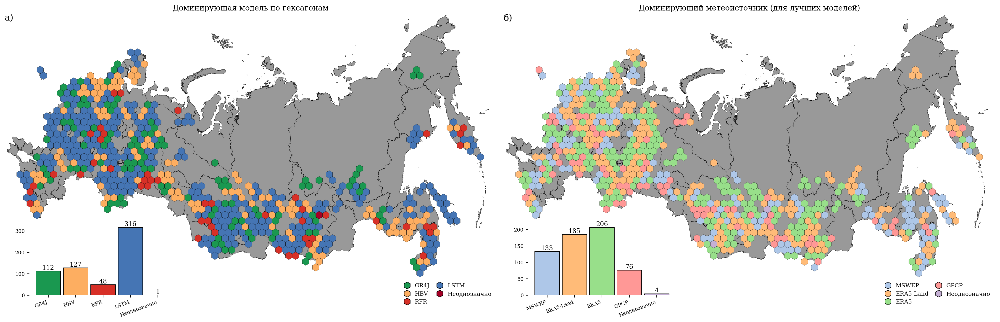


Статистика по гексагонам:
  Модели: {'GR4J': 112, 'HBV': 127, 'RFR': 48, 'LSTM': 316, 'Неоднозначно': 1}
  Метеоисточники: {'MSWEP': 133, 'ERA5-Land': 185, 'ERA5': 206, 'GPCP': 76, 'Неоднозначно': 4}


In [128]:

# Define dictionaries for each category type
model_type_dict = {
    "GR4J": 1.0,
    "HBV": 2.0,
    "RFR": 3.0,
    "LSTM": 4.0,
    "Неоднозначно": 5.0,
}

meteo_type_dict = {
    "MSWEP": 1.0,
    "ERA5-Land": 2.0,
    "ERA5": 3.0,
    "GPCP": 4.0,
    "Неоднозначно": 5.0,
}

# Get colors for each category type
_all_colors = get_cluster_colors(n_clusters=20)
_model_colors = _all_colors[10:15]
_meteo_colors = _all_colors[15:20]

# Side-by-side plot using updated hex_model_distribution_plots_n with per-column dicts
fig_combined, axes, hex_results, counts = hex_model_distribution_plots_n(
    watersheds=ws_nse,
    basemap_data=basemap_data,
    model_cols=["Лучшая модель", "Лучший метеоисточник"],
    model_dict=[model_type_dict, meteo_type_dict],  # List of dicts!
    label_list=["а)", "б)"],
    nrows=1,
    ncols=2,
    target_ws_per_hex=6.0,
    color_list=[_model_colors, _meteo_colors],  # List of color lists!
    figsize=(22, 9),
    with_histogram=True,
    histogram_rect=[0.05, 0.05, 0.30, 0.24],
    histogram_label_rotation=20,
    legend_show=True,
    legend_kwargs={"loc": "lower right", "bbox_to_anchor": (1.0, 0.0)},
    title_text=[
        "Доминирующая модель по гексагонам",
        "Доминирующий метеоисточник (для лучших моделей)",
    ],
)
plt.show()

print("\nСтатистика по гексагонам:")
print(f"  Модели: {counts['Лучшая модель'].to_dict()}")
print(f"  Метеоисточники: {counts['Лучший метеоисточник'].to_dict()}")

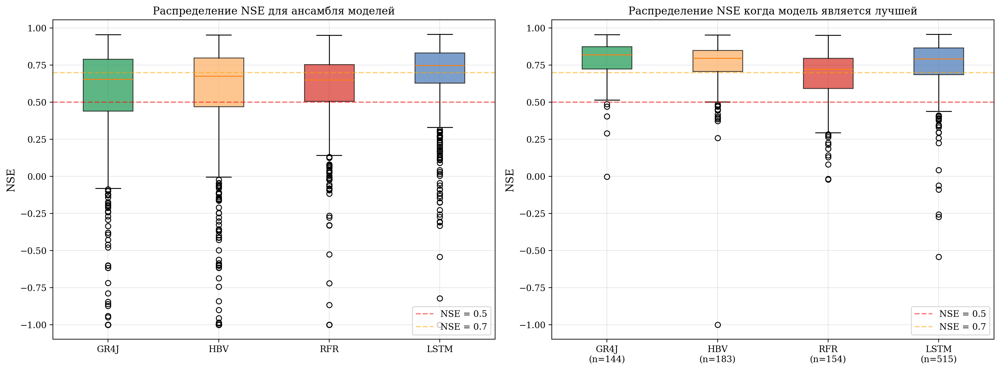

In [131]:
# Create boxplot comparison of best NSE values by model type
fig_box, axes_box = plt.subplots(1, 2, figsize=(16, 6))

# Box 1: Best NSE for each model type (ensemble of meteo sources)
_ax1 = axes_box[0]
_box_data = [
    gauges_nse["Best GR4J NSE"].dropna().clip(lower=-1.0),
    gauges_nse["Best HBV NSE"].dropna().clip(lower=-1.0),
    gauges_nse["Best RFR NSE"].dropna().clip(lower=-1.0),
    gauges_nse["Best LSTM NSE"].dropna().clip(lower=-1.0),
]
_bp1 = _ax1.boxplot(
    _box_data, patch_artist=True, tick_labels=["GR4J", "HBV", "RFR", "LSTM"]
)
for _patch, _color in zip(_bp1["boxes"], _model_colors[:4]):
    _patch.set_facecolor(_color)
    _patch.set_alpha(0.7)
_ax1.set_ylabel("NSE", fontsize=12)
_ax1.set_title("Распределение NSE для ансамбля моделей", fontsize=12)
_ax1.axhline(y=0.5, color="red", linestyle="--", alpha=0.5, label="NSE = 0.5")
_ax1.axhline(y=0.7, color="orange", linestyle="--", alpha=0.5, label="NSE = 0.7")
_ax1.legend(loc="lower right")
_ax1.grid(True, alpha=0.3)

# Box 2: Best NSE when that model is THE best
_ax2 = axes_box[1]
_box_data_best = []
_labels_best = []
for _model in ["GR4J", "HBV", "RFR", "LSTM"]:
    _mask = gauges_nse["Лучшая модель"] == _model
    if _mask.sum() > 0:
        _box_data_best.append(gauges_nse.loc[_mask, f"Best {_model} NSE"].dropna())
        _labels_best.append(f"{_model}\n(n={_mask.sum()})")

_bp2 = _ax2.boxplot(_box_data_best, patch_artist=True, tick_labels=_labels_best)
for _patch, _color in zip(_bp2["boxes"], _model_colors[: len(_labels_best)]):
    _patch.set_facecolor(_color)
    _patch.set_alpha(0.7)
_ax2.set_ylabel("NSE", fontsize=12)
_ax2.set_title("Распределение NSE когда модель является лучшей", fontsize=12)
_ax2.axhline(y=0.5, color="red", linestyle="--", alpha=0.5, label="NSE = 0.5")
_ax2.axhline(y=0.7, color="orange", linestyle="--", alpha=0.5, label="NSE = 0.7")
_ax2.legend(loc="lower right")
_ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

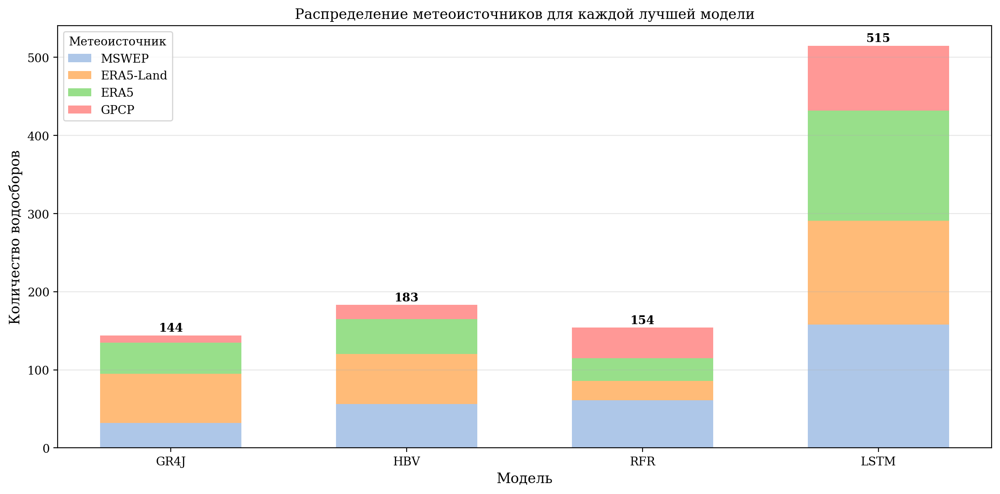

In [132]:
# Stacked bar chart: Model preference by meteo source
fig_stack, ax_stack = plt.subplots(figsize=(12, 6))

# Prepare data for stacked bar
_models = ["GR4J", "HBV", "RFR", "LSTM"]
_meteo_sources = ["MSWEP", "ERA5-Land", "ERA5", "GPCP"]

_stack_data = pd.DataFrame(index=_models, columns=_meteo_sources, dtype=float)
for _model in _models:
    for _meteo in _meteo_sources:
        _mask = (gauges_nse["Лучшая модель"] == _model) & (
            gauges_nse["Лучший метеоисточник"] == _meteo
        )
        _stack_data.loc[_model, _meteo] = _mask.sum()

# Create stacked bar chart
_bottom = np.zeros(len(_models))
_x = np.arange(len(_models))
_width = 0.6

for _i, _meteo in enumerate(_meteo_sources):
    _values = _stack_data[_meteo].values.astype(float)
    ax_stack.bar(
        _x, _values, _width, label=_meteo, bottom=_bottom, color=_meteo_colors[_i]
    )
    _bottom += _values

ax_stack.set_xlabel("Модель", fontsize=12)
ax_stack.set_ylabel("Количество водосборов", fontsize=12)
ax_stack.set_title("Распределение метеоисточников для каждой лучшей модели", fontsize=12)
ax_stack.set_xticks(_x)
ax_stack.set_xticklabels(_models)
ax_stack.legend(title="Метеоисточник", loc="upper left")
ax_stack.grid(True, alpha=0.3, axis="y")

# Add total counts on top of bars
for _i, _model in enumerate(_models):
    _total = _stack_data.loc[_model].sum()
    ax_stack.text(
        _i,
        _total + 2,
        f"{int(_total)}",
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold",
    )

plt.tight_layout()
plt.show()

In [ ]:
gauges_nse.to_file(
    "../res/chapter_two/tables/per_gauge_nse_results.geojson", driver="GeoJSON"
)